In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import matplotlib

In [3]:
import os
import logging
import argparse
import glob
import json

import numpy as np
from matplotlib.ticker import StrMethodFormatter

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn import metrics
import tensorflow as tf
import pandas as pd
from astropy.table import Table  # for NSA
from astropy import units as u
from sklearn.metrics import confusion_matrix, roc_curve
from PIL import Image
from scipy.stats import binom
from IPython.display import display, Markdown

from shared_astro_utils import astropy_utils, matching_utils
from zoobot.estimators import make_predictions, bayesian_estimator_funcs
from zoobot.tfrecord import read_tfrecord
from zoobot.uncertainty import discrete_coverage
from zoobot.estimators import input_utils, losses
from zoobot.tfrecord import catalog_to_tfrecord
from zoobot.active_learning import metrics, simulated_metrics, acquisition_utils, check_uncertainty, simulation_timeline, run_estimator_config


In [4]:
os.chdir('/home/walml/repos/zoobot')

In [5]:
label_cols = [
    'smooth-or-featured_smooth',
    'smooth-or-featured_featured-or-disk',
    'has-spiral-arms_yes',
    'has-spiral-arms_no',
#     'spiral-winding_tight',
#     'spiral-winding_medium',
#     'spiral-winding_loose',
    'bar_strong',
    'bar_weak',
    'bar_no',
    'bulge-size_dominant',
    'bulge-size_large',
    'bulge-size_moderate',
    'bulge-size_small',
    'bulge-size_none'
]

questions = [
    'smooth-or-featured',
    'has-spiral-arms',
#     'spiral-winding',
    'bar',
    'bulge-size'
]

schema = losses.Schema(label_cols, questions, version='decals')
schema.questions

{smooth-or-featured, indices 0 to 1, asked after None: (0, 1), has-spiral-arms, indices 2 to 3, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>: (2, 3), bar, indices 4 to 6, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>: (4, 6), bulge-size, indices 7 to 11, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>: (7, 11)}


[smooth-or-featured, indices 0 to 1, asked after None,
 has-spiral-arms, indices 2 to 3, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>,
 bar, indices 4 to 6, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>,
 bulge-size, indices 7 to 11, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>]

In [6]:
# df = pd.read_csv('temp/master_256_predictions_2500init.csv')
df = pd.read_csv('temp/effnet_latest.csv')

/home/walml/anaconda3/envs/zoobot/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (109) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
df.head()

,Unnamed: 0,iauname,nsa_id,ra_subject,dec_subject,petrotheta,petroth50,petroth90,redshift,local_fits_loc,...,bulge-size_dominant_prediction,bulge-size_dominant_prediction_mean,bulge-size_large_prediction,bulge-size_large_prediction_mean,bulge-size_moderate_prediction,bulge-size_moderate_prediction_mean,bulge-size_small_prediction,bulge-size_small_prediction_mean,bulge-size_none_prediction,bulge-size_none_prediction_mean
0,3007,J114311.80-005945.4,6394,175.799176,-0.995977,4.769891,2.403030,5.330101,0.093060,/Volumes/alpha/decals/fits_native/dr5/J114/J11...,...,"[0.04262910038232803, 0.016658904030919075, 0....",0.023788,"[0.15324892103672028, 0.08992495387792587, 0.1...",0.119022,"[0.19541844725608826, 0.2901086211204529, 0.29...",0.247091,"[0.20418624579906464, 0.3926066756248474, 0.25...",0.302042,"[0.4045172929763794, 0.2107008546590805, 0.263...",0.308057
1,3013,J114234.93-010223.3,6409,175.645594,-1.039803,8.798181,3.986430,9.777639,0.108958,/Volumes/alpha/decals/fits_native/dr5/J114/J11...,...,"[0.007415104657411575, 0.007838904857635498, 0...",0.006908,"[0.03921530023217201, 0.04610105976462364, 0.0...",0.044864,"[0.41776421666145325, 0.4635247588157654, 0.49...",0.492537,"[0.5211817622184753, 0.4722156524658203, 0.435...",0.444397,"[0.014423578977584839, 0.010319691151380539, 0...",0.011294
2,3014,J114158.56-011334.4,6411,175.494016,-1.226278,9.472872,3.862174,10.472028,0.107790,/Volumes/alpha/decals/fits_native/dr5/J114/J11...,...,"[0.008610561490058899, 0.0071463510394096375, ...",0.008307,"[0.0454450361430645, 0.04326174035668373, 0.05...",0.041897,"[0.4529438018798828, 0.46400731801986694, 0.35...",0.428557,"[0.4478592872619629, 0.44699808955192566, 0.46...",0.484512,"[0.045141324400901794, 0.03858647122979164, 0....",0.036727
3,3015,J114221.35-011301.2,6414,175.588955,-1.217026,6.101641,2.886945,7.018666,0.076975,/Volumes/alpha/decals/fits_native/dr5/J114/J11...,...,"[0.021249478682875633, 0.018415333703160286, 0...",0.019684,"[0.10940727591514587, 0.1085921972990036, 0.10...",0.106024,"[0.5854149460792542, 0.5571314096450806, 0.584...",0.566463,"[0.23216891288757324, 0.27923446893692017, 0.2...",0.250000,"[0.05175939202308655, 0.03662663325667381, 0.0...",0.057829
4,3021,J114100.38-005812.6,6430,175.251666,-0.970073,8.128530,3.944574,9.274990,0.028913,/Volumes/alpha/decals/fits_native/dr5/J114/J11...,...,"[0.00965325441211462, 0.017385421320796013, 0....",0.012718,"[0.03677285462617874, 0.0501408725976944, 0.04...",0.050768,"[0.3044124245643616, 0.17468252778053284, 0.31...",0.263830,"[0.4528931975364685, 0.24049556255340576, 0.41...",0.330399,"[0.19626830518245697, 0.5172955989837646, 0.20...",0.342286


In [8]:
smooth_samples = np.array([json.loads(x) for x in df['smooth-or-featured_smooth_prediction']])
smooth_samples

array([[0.1628457 , 0.12317292, 0.15922555, ..., 0.15382065, 0.17402089,
        0.21653813],
       [0.06466458, 0.06834858, 0.06288904, ..., 0.05078624, 0.06817643,
        0.0443319 ],
       [0.15726911, 0.15653938, 0.27009985, ..., 0.16222149, 0.21568276,
        0.16886522],
       ...,
       [0.07390058, 0.05374718, 0.04901228, ..., 0.05525795, 0.05563412,
        0.08546674],
       [0.19347607, 0.16450958, 0.23118557, ..., 0.19199516, 0.21741597,
        0.19941314],
       [0.34397814, 0.39627868, 0.33753961, ..., 0.41243997, 0.36733332,
        0.36609507]])

In [9]:
smooth_acq = acquisition_utils.mutual_info_acquisition_func(smooth_samples, 40)

(array([2.360e+03, 3.343e+03, 2.488e+03, 1.395e+03, 6.610e+02, 2.670e+02,
        7.800e+01, 2.200e+01, 8.000e+00, 2.000e+00]),
 array([0.00339099, 0.06324805, 0.12310511, 0.18296217, 0.24281922,
        0.30267628, 0.36253334, 0.4223904 , 0.48224745, 0.54210451,
        0.60196157]),
 <a list of 10 Patch objects>)

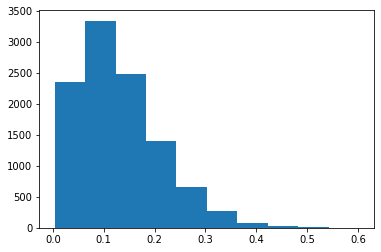

In [10]:
plt.hist(smooth_acq)

In [11]:
df['file_loc'][np.argsort(smooth_acq)[-10:]]

2199    /media/walml/beta/decals/png_native/dr5/J004/J...
3165    /media/walml/beta/decals/png_native/dr5/J015/J...
3433    /media/walml/beta/decals/png_native/dr5/J022/J...
342     /media/walml/beta/decals/png_native/dr5/J132/J...
5785    /media/walml/beta/decals/png_native/dr5/J141/J...
4273    /media/walml/beta/decals/png_native/dr5/J090/J...
1914    /media/walml/beta/decals/png_native/dr5/J002/J...
2344    /media/walml/beta/decals/png_native/dr5/J005/J...
2396    /media/walml/beta/decals/png_native/dr5/J005/J...
8177    /media/walml/beta/decals/png_native/dr5/J011/J...
Name: file_loc, dtype: object

In [30]:
# copied from trust_the_model.ipynb
def show_galaxies(df, scale=3, nrows=3, ncols=3):
    fig = plt.gcf()

    plt.figure(figsize=(scale * nrows, scale * ncols * 1.025))
    gs1 = gridspec.GridSpec(nrows, ncols)
    gs1.update(wspace=0.0, hspace=0.0)
    galaxy_n = 0
    for row_n in range(nrows):
        for col_n in range(ncols):
            galaxy = df.iloc[galaxy_n]
            image = Image.open(galaxy['file_loc'])
            ax = plt.subplot(gs1[row_n, col_n])
            ax.imshow(image)
#             ax.text(10, 20, 'Smooth = {:.2f}'.format(galaxy['smooth-or-featured_smooth_fraction']), fontsize=12, color='r')
#             ax.text(10, 50, r'$\rho = {:.2f}$, Var ${:.3f}$'.format(galaxy['median_prediction'], 3*galaxy['predictions_var']), fontsize=12, color='r')
#             ax.text(10, 80, '$L = {:.2f}$'.format(galaxy['bcnn_likelihood']), fontsize=12, color='r')
            ax.axis('off')
            galaxy_n += 1
#     print('Mean L: {:.2f}'.format(df[:nrows * ncols]['bcnn_likelihood'].mean()))
    fig = plt.gcf()
#     fig.tight_layout()
    return fig


<Figure size 432x288 with 0 Axes>

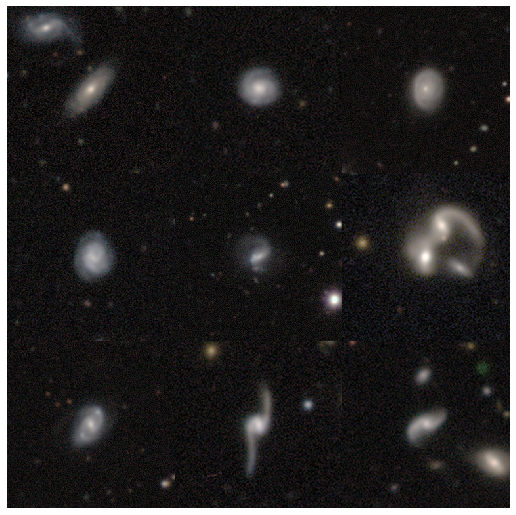

In [13]:
top_smooth = df.iloc[np.argsort(smooth_acq)[-10:]]
_ = show_galaxies(top_smooth)

<Figure size 432x288 with 0 Axes>

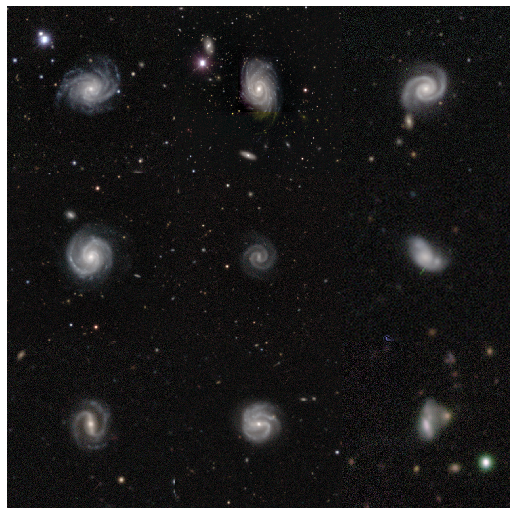

In [14]:
bottom_smooth = df.iloc[np.argsort(smooth_acq)[:10]]
_ = show_galaxies(bottom_smooth)

In [15]:
df.columns.values

array(['Unnamed: 0', 'iauname', 'nsa_id', 'ra_subject', 'dec_subject',
       'petrotheta', 'petroth50', 'petroth90', 'redshift',
       'local_fits_loc', 'local_png_loc', 'fits_ready', 'fits_filled',
       'png_ready', 'best_match', 'sky_separation', 'nsa_version', 'mag',
       'ra', 'dec', 'file_loc', 'subject_id', 'bar_no', 'bar_strong',
       'bar_weak', 'bulge-size_dominant', 'bulge-size_large',
       'bulge-size_moderate', 'bulge-size_none', 'bulge-size_small',
       'disk-edge-on_no', 'disk-edge-on_yes', 'edge-on-bulge_boxy',
       'edge-on-bulge_none', 'edge-on-bulge_rounded',
       'has-spiral-arms_no', 'has-spiral-arms_yes',
       'how-rounded_cigar-shaped', 'how-rounded_in-between',
       'how-rounded_round', 'merging_both-v1',
       'merging_major-disturbance', 'merging_merger',
       'merging_minor-disturbance', 'merging_neither-v1', 'merging_none',
       'merging_tidal-debris-v1', 'smooth-or-featured_artifact',
       'smooth-or-featured_featured-or-disk', 'sm

In [16]:
spiral_samples = np.array([json.loads(x) for x in df['has-spiral-arms_yes_prediction']])
spiral_acq = acquisition_utils.mutual_info_acquisition_func(spiral_samples, df['smooth-or-featured_featured-or-disk'])


<Figure size 432x288 with 0 Axes>

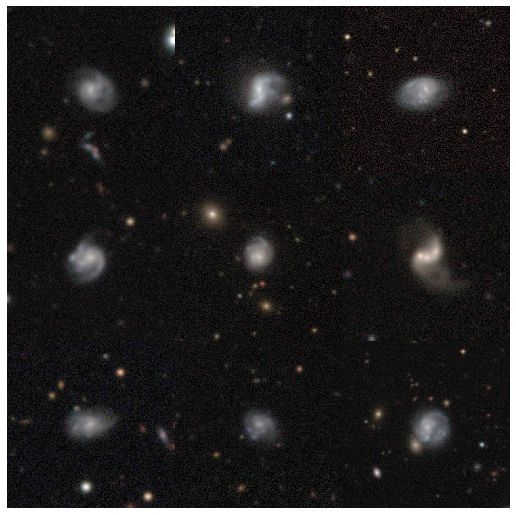

In [17]:
top_spiral = df.iloc[np.argsort(spiral_acq)[-10:]]
_ = show_galaxies(top_spiral)

<Figure size 432x288 with 0 Axes>

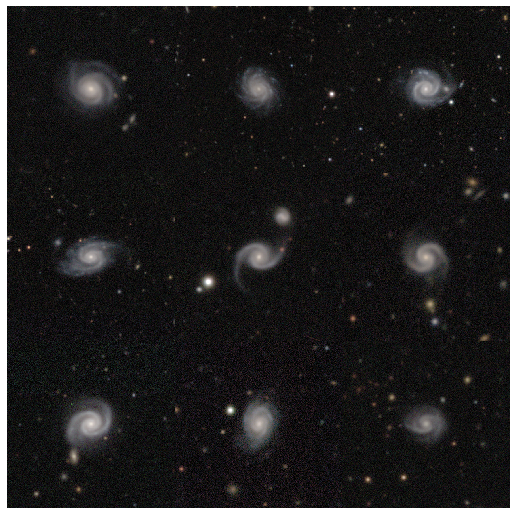

In [18]:
bottom_spiral = df.iloc[np.argsort(spiral_acq)[:10]]
_ = show_galaxies(bottom_spiral)

In [19]:
samples = np.array([np.array([json.loads(x) for x in df[answer + '_prediction']]) for answer in label_cols]).swapaxes(0, 1)
samples.shape

(10624, 12, 15)

In [20]:
acquisition_values = acquisition_utils.mutual_info_acquisition_func_multiq(samples, schema, retirement=40)
acquisition_values.shape

(10624, 12)

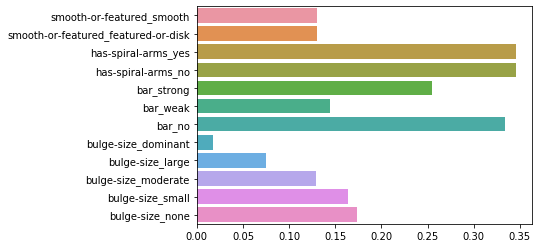

In [21]:
sns.barplot(x=acquisition_values.mean(axis=0), y=label_cols)

In [22]:
acq_by_answer = acquisition_values.mean(axis=0)
acq_by_q = {}
for q, indices in schema.named_index_groups.items():  # yay for ordered dicts
    acq_by_q[q.text] = acq_by_answer[indices[0]:indices[1]+1].mean()

In [23]:
acq_by_q

{'smooth-or-featured': 0.13009875107006735,
 'has-spiral-arms': 0.3455182985346579,
 'bar': 0.24449945634682457,
 'bulge-size': 0.11208921997876109}

Text(0, 0.5, 'Question')

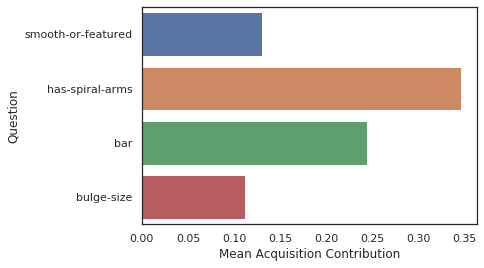

In [28]:
sns.set_style('white')
sns.barplot(x=[v for v in acq_by_q.values()], y=[k for k in acq_by_q.keys()])
plt.xlabel('Mean Acquisition Contribution')
plt.ylabel('Question')


<Figure size 432x288 with 0 Axes>

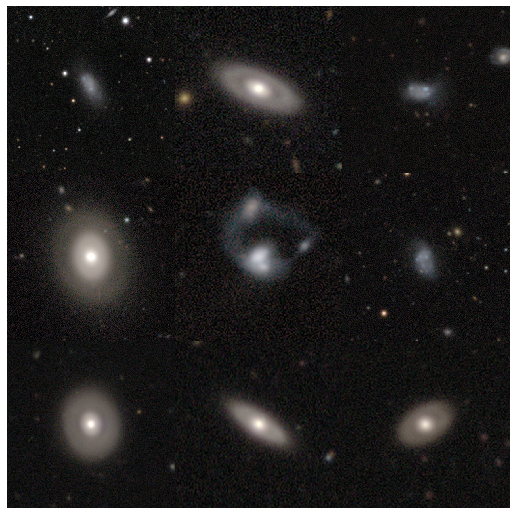

In [35]:
_ = show_galaxies(df[df['has-spiral-arms_yes'] < 0.2].sort_values('bar_strong'))

<Figure size 432x288 with 0 Axes>

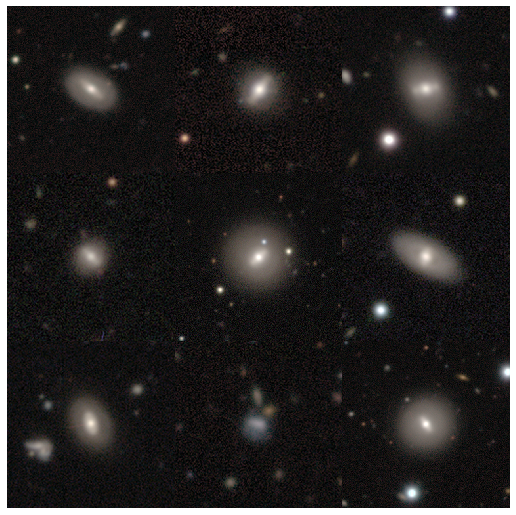

In [36]:
_ = show_galaxies(df[df['has-spiral-arms_yes'] < 0.2].sort_values('bar_strong', ascending=False))

<Figure size 432x288 with 0 Axes>

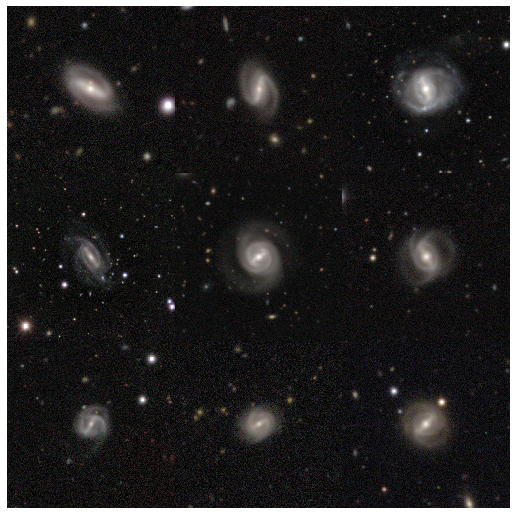

In [37]:
_ = show_galaxies(df[df['has-spiral-arms_yes'] > 0.9].sort_values('bar_strong', ascending=False))

In [38]:
schema.named_index_groups

{smooth-or-featured, indices 0 to 1, asked after None: (0, 1),
 has-spiral-arms, indices 2 to 3, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>: (2,
  3),
 bar, indices 4 to 6, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>: (4,
  6),
 bulge-size, indices 7 to 11, asked after <zoobot.estimators.losses.Answer object at 0x7f0296c0ad90>: (7,
  11)}

In [39]:
temp = pd.DataFrame(data=[x for x in acquisition_values], columns=label_cols)

In [40]:
temp.head()

,smooth-or-featured_smooth,smooth-or-featured_featured-or-disk,has-spiral-arms_yes,has-spiral-arms_no,bar_strong,bar_weak,bar_no,bulge-size_dominant,bulge-size_large,bulge-size_moderate,bulge-size_small,bulge-size_none
0,0.203726,0.203726,0.534254,0.534254,0.242176,0.153652,0.332961,0.046829,0.250741,0.207251,0.332118,0.559945
1,0.052311,0.052311,0.171322,0.171322,0.279888,0.215044,0.431601,0.002183,0.013852,0.121353,0.139252,0.012958
2,0.126090,0.126090,0.100965,0.100965,0.193805,0.074474,0.203683,0.007910,0.048889,0.117548,0.098120,0.170725
3,0.025507,0.025507,0.117972,0.117972,0.284429,0.080019,0.312680,0.005467,0.031809,0.033409,0.031264,0.040918
4,0.046019,0.046019,0.639714,0.639714,0.316202,0.359775,0.581338,0.009303,0.035901,0.218647,0.183791,0.481336


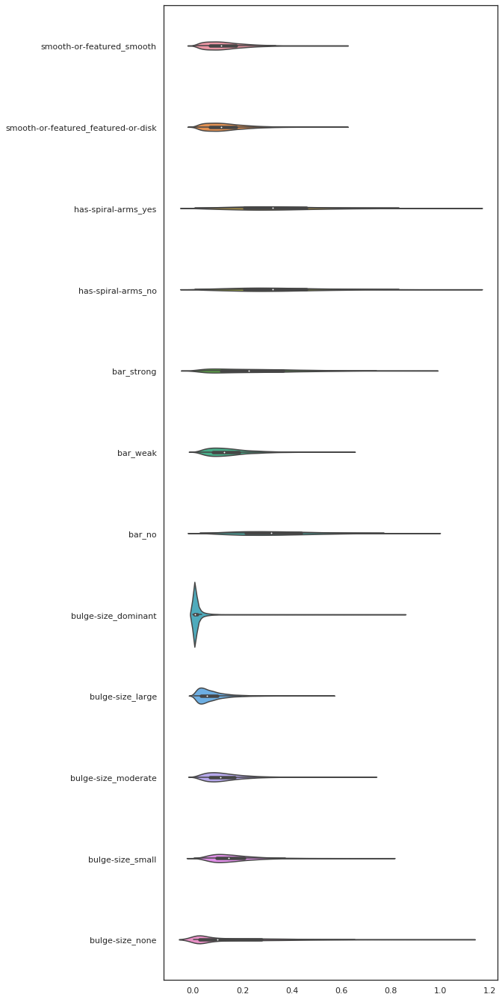

In [41]:
fig, ax = plt.subplots(figsize=(8, 24))
sns.violinplot(data=temp, orient='h', ax=ax)

In [42]:
ordered_by_acq = df.iloc[np.argsort(acquisition_values.mean(axis=1))]

<Figure size 432x288 with 0 Axes>

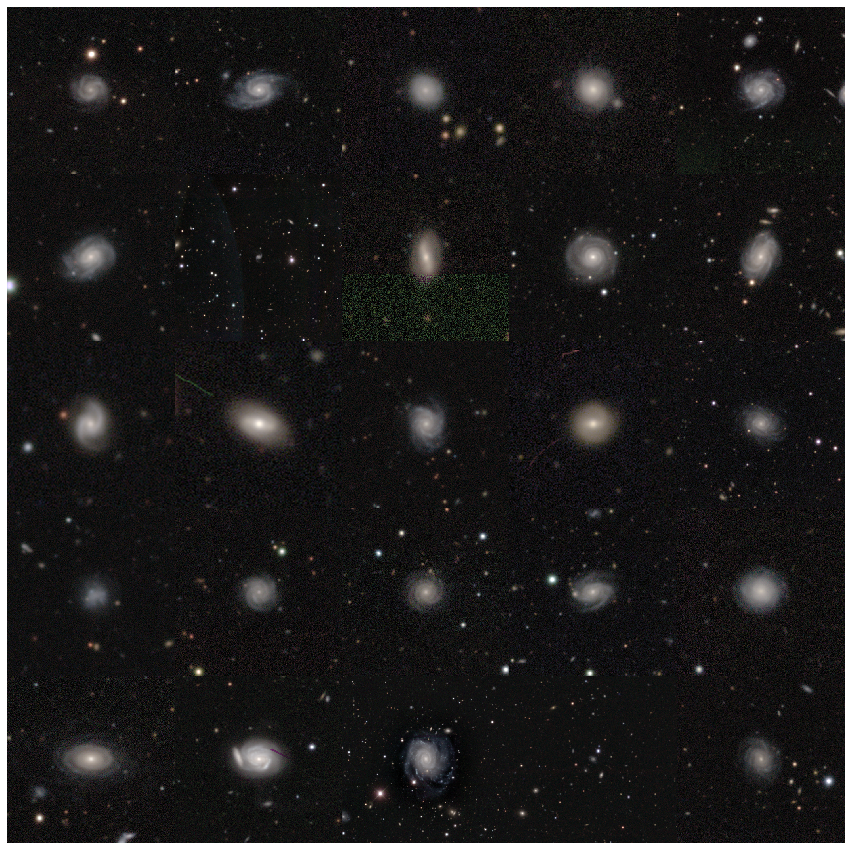

In [43]:
_ = show_galaxies(ordered_by_acq[:25], ncols=5, nrows=5)

<Figure size 432x288 with 0 Axes>

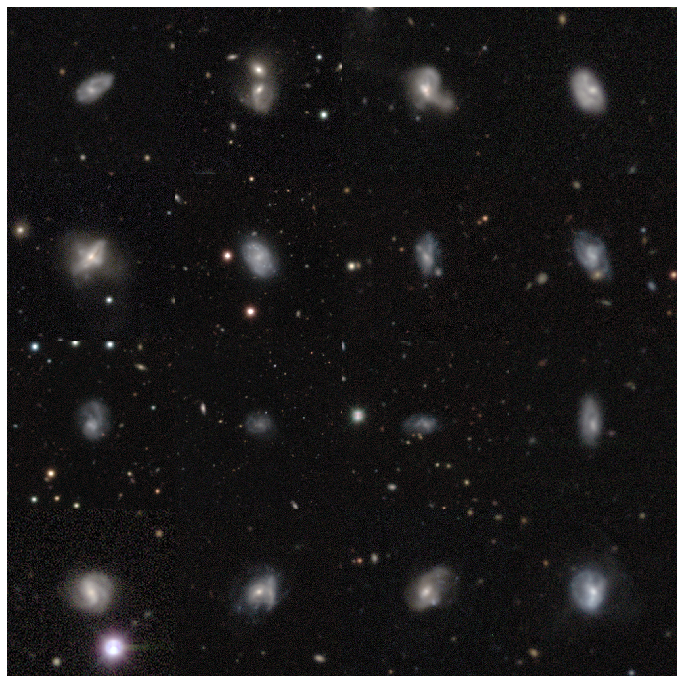

In [50]:
_ = show_galaxies(ordered_by_acq[-40:-20], ncols=4, nrows=4)

<Figure size 432x288 with 0 Axes>

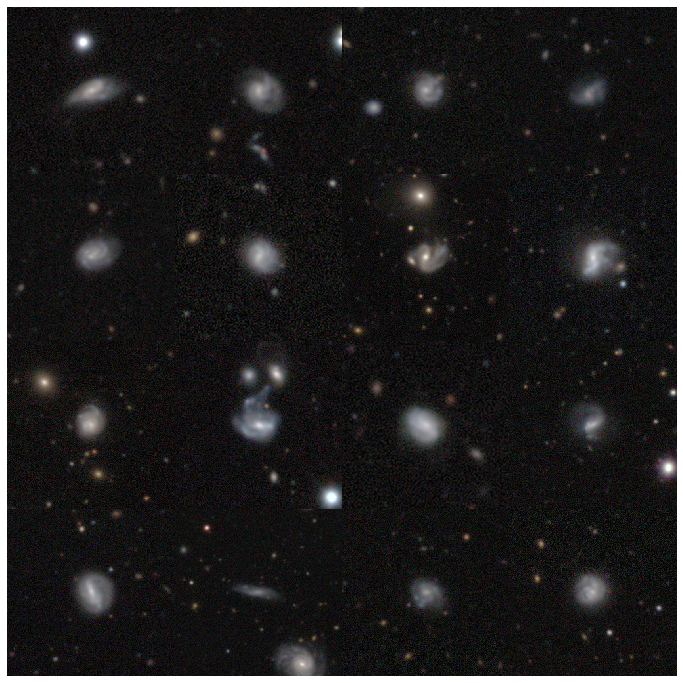

In [51]:
_ = show_galaxies(ordered_by_acq[-20:], ncols=4, nrows=4)

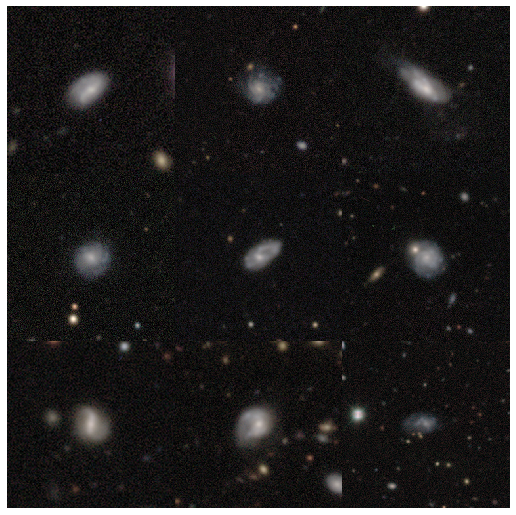

<Figure size 432x288 with 0 Axes>

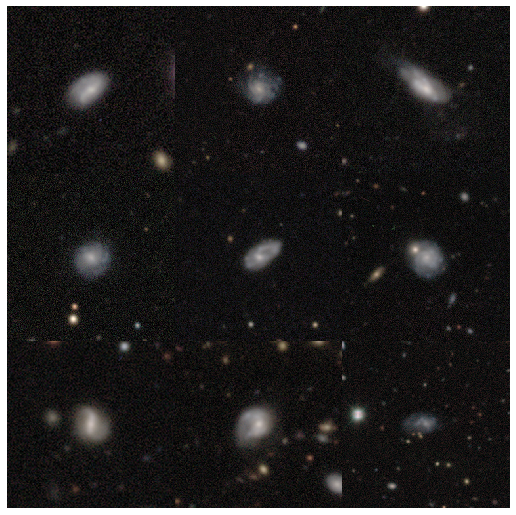

In [61]:
unc = np.std(samples, axis=2).mean(axis=1)
sort = np.argsort(unc)
top = [i for i in sort[-50:]]
show_galaxies(df.iloc[top])

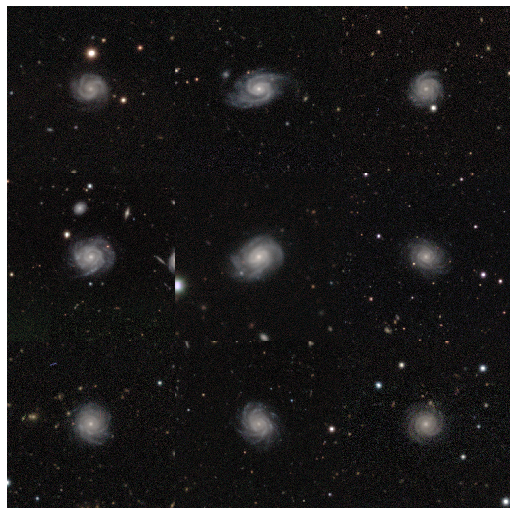

<Figure size 432x288 with 0 Axes>

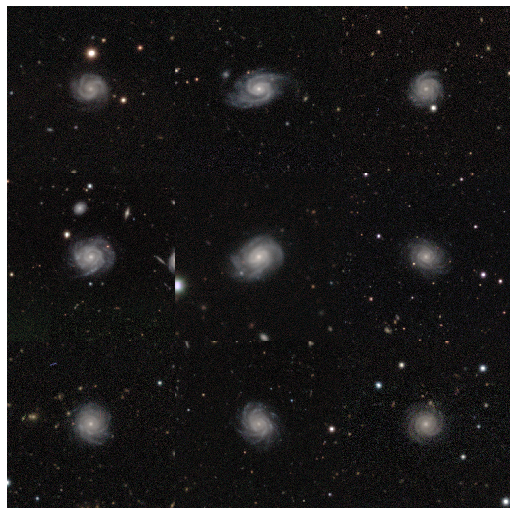

In [62]:
bottom = [i for i in sort[:50]]
show_galaxies(df.iloc[bottom])

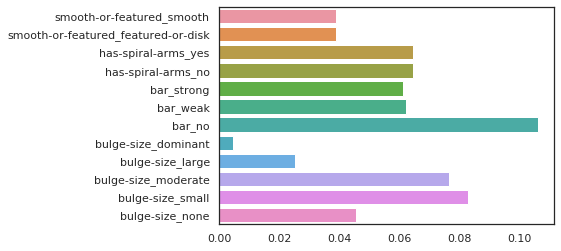

In [45]:
acq_sorted = acquisition_values[np.argsort(acquisition_values.mean(axis=1))]
sns.barplot(x=acq_sorted[:100].mean(axis=0), y=label_cols)

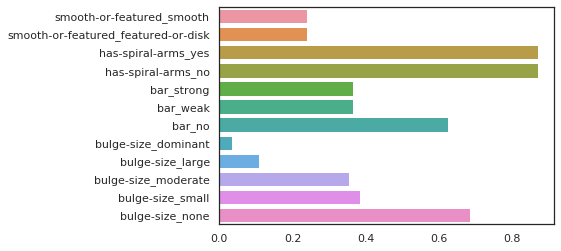

In [46]:
sns.barplot(x=acq_sorted[-100:].mean(axis=0), y=label_cols)

In [ ]:
TODO show galaxies ordered by uncertainty